In [1]:
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

## Dataset

### Augmentation

In [2]:
# Data Augmentation
def build_augmentation(is_train=True):
    # 훈련용 데이터일 경우
    if is_train:    
        # 50%의 확률로 좌우대칭
        # 50%의 확률로 RandomSizedCrop
        # resize (224,224)
        return Compose([
                        HorizontalFlip(p=0.5),    
                        RandomSizedCrop(         
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=224,
                            width=224,
                            p=0.5
                        ),
                        Resize(width=224, height=224)
                    ])
    # test dataset -> resize(224,224)
    return Compose([ Resize(width=224, height=224) ])

### Kitti Dataset 정의

In [3]:
class KittiGenerator(tf.keras.utils.Sequence):
    
    def __init__(
        self, dir_path,
        batch_size=16,
        img_size=(224,224,3),
        output_size=(224,224),
        is_train=True,
        augmentation=None
    ):
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.img_size = img_size
        self.output_size = output_size
        self.is_train = is_train
        self.augmentation = augmentation
        
        self.data = self.load_dataset()
    
    # dataset path를 통해 image, label 가져오기
    def load_dataset(self):
        input_images = glob(os.path.join(self.dir_path, 'image_2', '*.png'))
        label_images = glob(os.path.join(self.dir_path, 'semantic', '*.png'))
        input_images.sort()
        label_images.sort()
        
        assert len(input_images) == len(label_images)
        
        data = [_ for _ in zip(input_images, label_images)]
        
        if self.is_train: 
            return data[:-30]
        return data[-30:]
    
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)
    
    def __getitem__(self, index):
        batch_data = self.data[index*self.batch_size : (index+1)*self.batch_size]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])
        
        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            
            # output 7만 1로 변환 -> 7: 도로 segmentation
            _output = (_output==7).astype(np.uint8)*1
            
            data = {
                'image': _input,
                'mask': _output
            }
            augmented = self.augmentation(**data)
            inputs[i] = augmented['image']/255
            outputs[i] = augmented['mask']
        return inputs, outputs
        
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        
        if self.is_train:
            np.random.shuffle(self.indexes)
            return self.indexes

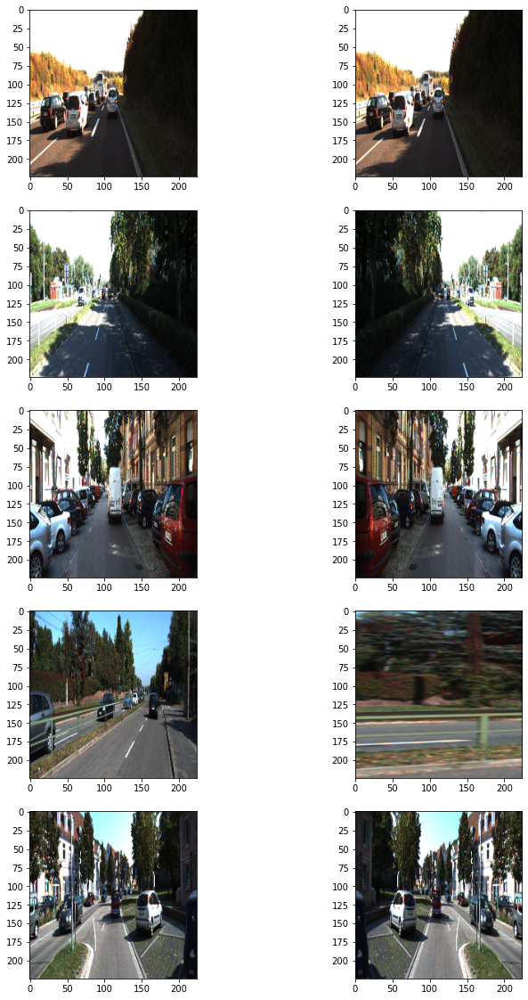

In [4]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

[[23 23 23 ... 21 21 21]
 [23 23 23 ... 21 21 21]
 [23 23 23 ... 21 21 21]
 ...
 [ 7  7  7 ... 22 22 22]
 [ 7  7  7 ... 22 22 22]
 [ 7  7  7 ...  7 22 22]]


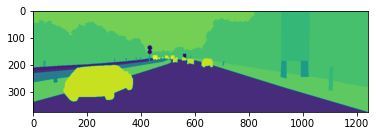

In [33]:
# output data
i = 100
label_sample_path = f'/aiffel/aiffel/semantic_segmentation/data/training/semantic/00{str(i).zfill(4)}_10.png'

label_sample = imread(label_sample_path)

print(label_sample)
plt.imshow(label_sample)
plt.show()

### Train, Test Dataset

In [5]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

## Model

### U-Net Model

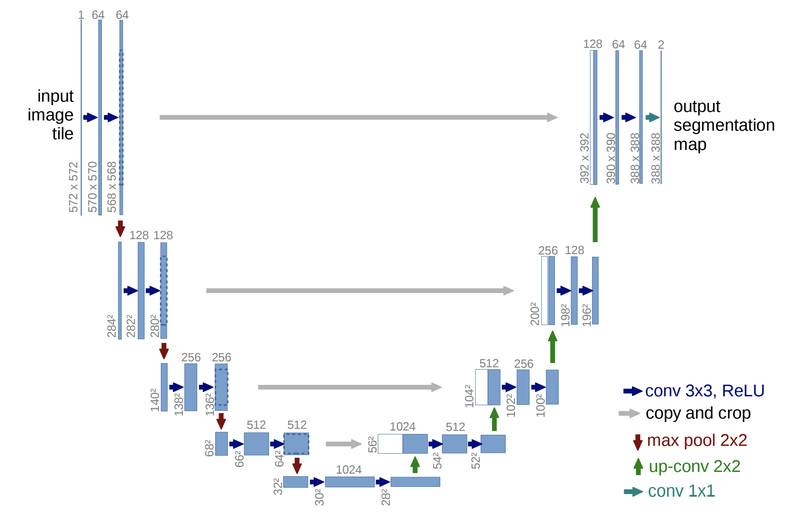

**U-Net 구현**  
1. Conv 내 padding 사용
    - 그림의 U-Net에서는 padding을 사용하지 않음
    - 하지만 쉬운 구현을 위해 padding을 사용함
    - 그에 따라 input의 이미지 크기와 output의 이미지 크기가 동일하게 됨
2. Upsampling은 Conv2DTranspose로 구현
3. 마지막 output은 sigmoid로 구현
    - 각 픽셀의 0,1을 구분하기 때문

In [6]:
def build_model(input_shape=(224, 224, 3)):
    model = None
    # TODO: input_shape에 따라 U-Net을 만들어주세요
    # 이때 model은 fully convolutional해야 합니다.
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x_1 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x_2 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x_3 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x_4 = x

    x = tf.keras.layers.MaxPooling2D(pool_size=2, padding='same')(x)
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(1024, 3, activation='relu', padding='same')(x)
    
    x = tf.keras.layers.Conv2DTranspose(512, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_4])
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(256, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_3])
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_2])
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, activation=None, padding='same')(x)
    x = tf.keras.layers.Concatenate()([x, x_1])
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    outputs = tf.keras.layers.Conv2D(1, 1, activation='sigmoid', padding='same')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

build_model().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

### Model Train

In [7]:
EPOCHS = 50

model = build_model()
model.compile(optimizer = tf.keras.optimizers.Adam(1e-4), loss = 'binary_crossentropy')

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'./checkpoint/checkpoint_epoch_{EPOCHS}.hdf5',
    save_best_only=True,
    save_weights_only = True,
    monitor='val_loss'
)

callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

history = model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS,
    callbacks=[
        callback_checkpoint,
        #callback_earlystop
    ]
 )

model_path = f'./model/unet_epoch_{EPOCHS}.h5'
model.save(model_path)

Epoch 1/50
11/11 [==============================] - 28s 826ms/step - loss: 0.6666 - val_loss: 0.6284
Epoch 2/50
11/11 [==============================] - 9s 749ms/step - loss: 0.6185 - val_loss: 0.5968
Epoch 3/50
11/11 [==============================] - 9s 745ms/step - loss: 0.5577 - val_loss: 0.5170
Epoch 4/50
11/11 [==============================] - 9s 738ms/step - loss: 0.4570 - val_loss: 0.4809
Epoch 5/50
11/11 [==============================] - 9s 732ms/step - loss: 0.3545 - val_loss: 0.3831
Epoch 6/50
11/11 [==============================] - 9s 735ms/step - loss: 0.2898 - val_loss: 0.2969
Epoch 7/50
11/11 [==============================] - 9s 737ms/step - loss: 0.3020 - val_loss: 0.2720
Epoch 8/50
11/11 [==============================] - 9s 737ms/step - loss: 0.2697 - val_loss: 0.2624
Epoch 9/50
11/11 [==============================] - 9s 733ms/step - loss: 0.2409 - val_loss: 0.2868
Epoch 10/50
11/11 [==============================] - 9s 741ms/step - loss: 0.2112 - val_loss: 0.243

NameError: name 'EPOHCS' is not defined

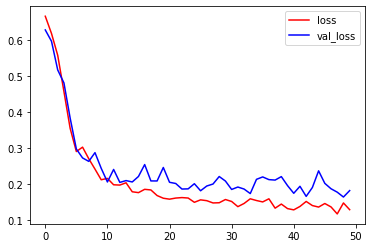

In [8]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], 'r', label='loss')
plt.plot(history.history['val_loss'], 'b', label='val_loss')
plt.legend()
plt.show()

좀 더 내려갈 수 있을듯?

## Prediction

In [9]:
def get_output(model, preproc, image_path, output_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()
    return output

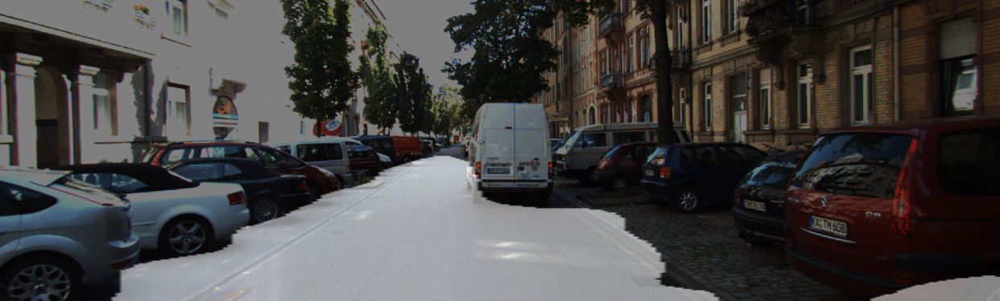

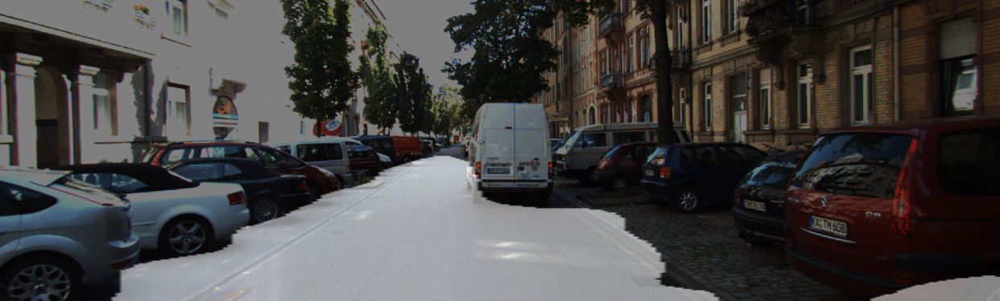

In [10]:
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [11]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)# intersection을 구하는 코드를 작성해주세요.
    union = np.logical_or(target, prediction)# Union을 구하는 코드를 작성해주세요.
    iou_score = np.sum(intersection) / np.sum(union)# iou 스코어를 구하되 결과값을 float로 만들어주세요!
    print('IoU : %f' % iou_score )
    return iou_score

In [22]:
def get_output(model, preproc, image_path, output_path, label_path, threshold=0.5):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=threshold).astype(np.uint8).squeeze(-1)*255
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

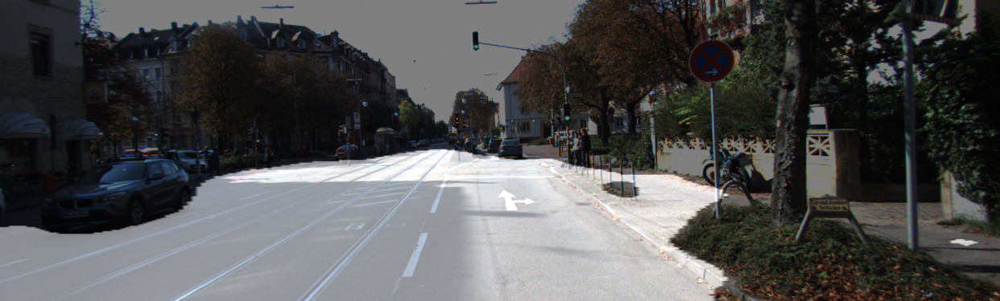

IoU : 0.871212


0.8712121212121212

In [23]:
i = 1 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

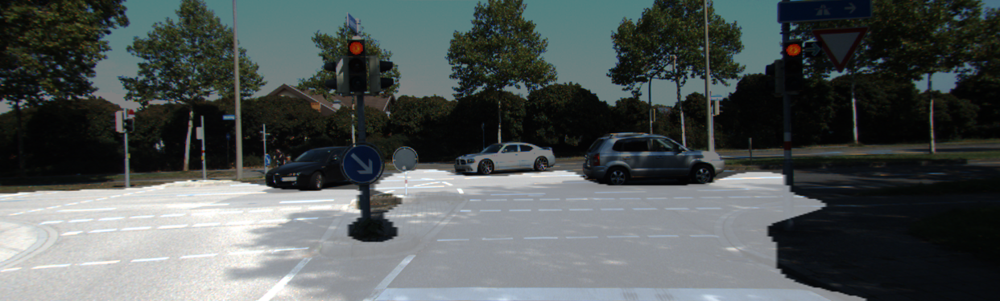

IoU : 0.807195


0.8071948505083318

In [24]:
i = 10
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

생각보다 높은 수치로 나온다.

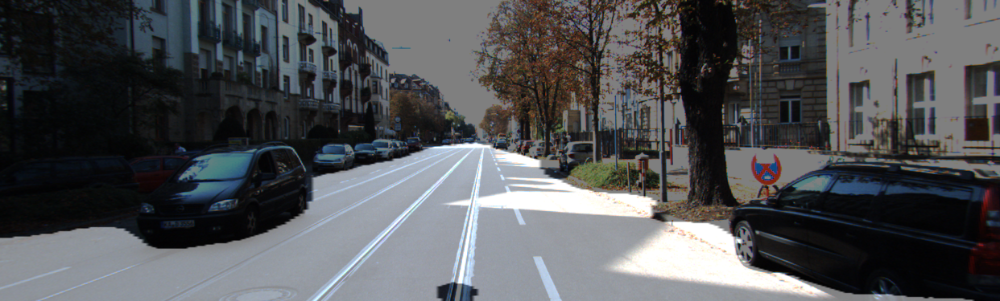

0번 image
IoU : 0.919890


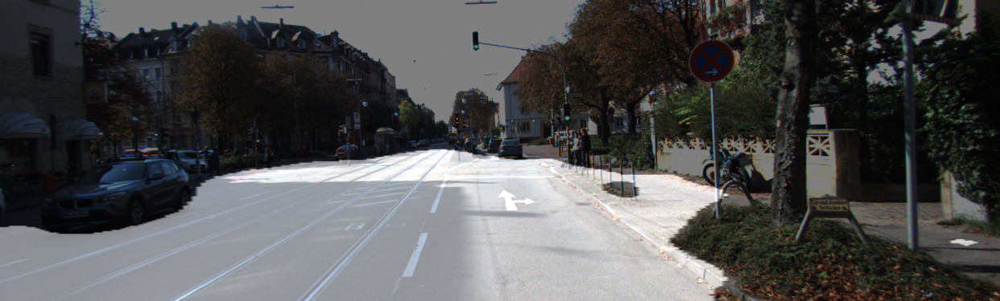

1번 image
IoU : 0.871212


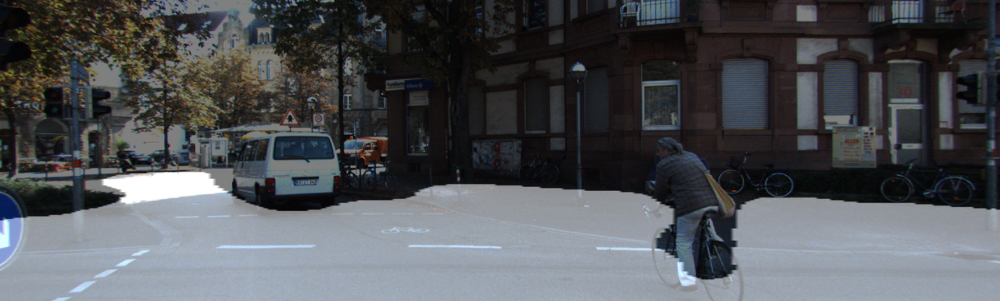

2번 image
IoU : 0.657966


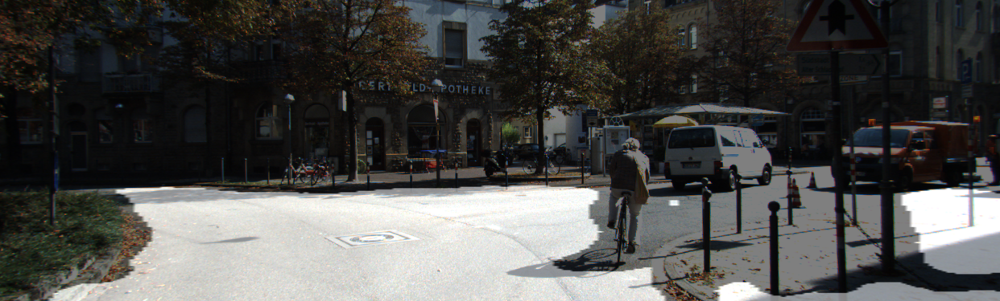

3번 image
IoU : 0.663737


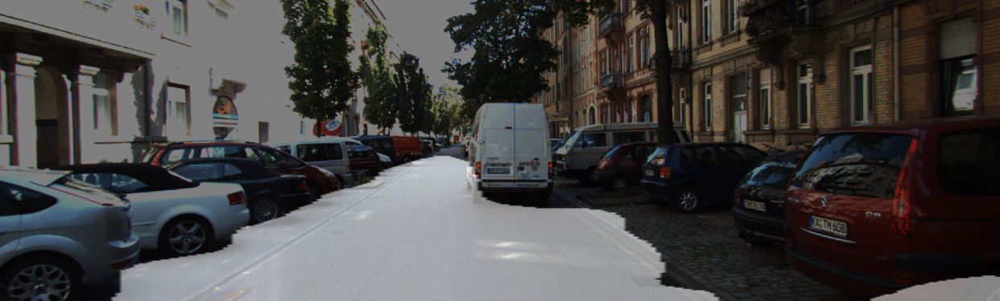

4번 image
IoU : 0.719603


In [25]:
# 다양한 이미지로 테스트 시도
for i in range(5):
    output, prediction, target = get_output(
        model, 
        test_preproc,
        image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
        output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
        label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
    )
    print(f'{i}번 image')
    calculate_iou_score(target, prediction)

## U-Net++

In [71]:
def standard_unit(input_tensor, stage, nb_filter, kernel_size=3):
    x = tf.keras.layers.Conv2D(nb_filter, (kernel_size, kernel_size), activation='relu', name='conv'+stage+'_1', kernel_initializer = 'he_normal', padding='same')(input_tensor)
    x = tf.keras.layers.Conv2D(nb_filter, (kernel_size, kernel_size), activation='relu', name='conv'+stage+'_2', kernel_initializer = 'he_normal', padding='same')(x)
    return x


def build_UNetPP(input_shape=(224, 224, 3)):

    nb_filter = [64,128,256,512,1024]
    bn_axis = 3
    img_input = tf.keras.Input(shape=input_shape)

    conv1_1 = standard_unit(img_input, stage='11', nb_filter=nb_filter[0])
    pool1 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = standard_unit(pool1, stage='21', nb_filter=nb_filter[1])
    pool2 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = tf.keras.layers.concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = standard_unit(conv1_2, stage='12', nb_filter=nb_filter[0])

    conv3_1 = standard_unit(pool2, stage='31', nb_filter=nb_filter[2])
    pool3 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = tf.keras.layers.concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = standard_unit(conv2_2, stage='22', nb_filter=nb_filter[1])

    up1_3 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = tf.keras.layers.concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = standard_unit(conv1_3, stage='13', nb_filter=nb_filter[0])

    conv4_1 = standard_unit(pool3, stage='41', nb_filter=nb_filter[3])
    pool4 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = tf.keras.layers.Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = tf.keras.layers.concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = standard_unit(conv3_2, stage='32', nb_filter=nb_filter[2])

    up2_3 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = tf.keras.layers.concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = standard_unit(conv2_3, stage='23', nb_filter=nb_filter[1])

    up1_4 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = tf.keras.layers.concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = standard_unit(conv1_4, stage='14', nb_filter=nb_filter[0])

    conv5_1 = standard_unit(pool4, stage='51', nb_filter=nb_filter[4])

    up4_2 = tf.keras.layers.Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = tf.keras.layers.concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = standard_unit(conv4_2, stage='42', nb_filter=nb_filter[3])

    up3_3 = tf.keras.layers.Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = tf.keras.layers.concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = standard_unit(conv3_3, stage='33', nb_filter=nb_filter[2])

    up2_4 = tf.keras.layers.Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = tf.keras.layers.concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = standard_unit(conv2_4, stage='24', nb_filter=nb_filter[1])

    up1_5 = tf.keras.layers.Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = tf.keras.layers.concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = standard_unit(conv1_5, stage='15', nb_filter=nb_filter[0])

    nestnet_output = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', name='output', kernel_initializer = 'he_normal', padding='same')(conv1_5)

    model = tf.keras.Model(inputs=img_input, outputs=[nestnet_output])
    return model

build_UNetPP().summary()

Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv11_1 (Conv2D)               (None, 224, 224, 64) 1792        input_28[0][0]                   
__________________________________________________________________________________________________
conv11_2 (Conv2D)               (None, 224, 224, 64) 36928       conv11_1[0][0]                   
__________________________________________________________________________________________________
pool1 (MaxPooling2D)            (None, 112, 112, 64) 0           conv11_2[0][0]                   
___________________________________________________________________________________________

In [72]:
from keras import backend as K

def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)

In [ ]:
UNetPP = build_UNetPP()

UNetPP.compile(optimizer = tf.keras.optimizers.Adam(1e-4), loss = bce_dice_loss)

callback_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = f'./checkpoint/unetpp_epoch_{EPOCHS}.hdf5',
    save_best_only=True,
    save_weights_only = True,
    monitor='val_loss'
)

callback_earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

history_unetpp = UNetPP.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=EPOCHS,
    callbacks=[
        callback_checkpoint,
        callback_earlystop
    ]
 )

unetpp_path = f'./model/unetpp_epoch_{EPOCHS}.h5'
UNetPP.save(unetpp_path)

Epoch 1/50
11/11 [==============================] - 23s 2s/step - loss: 0.0159 - val_loss: -0.0554
Epoch 2/50
11/11 [==============================] - 19s 2s/step - loss: -0.1954 - val_loss: -0.2813
Epoch 3/50
11/11 [==============================] - 19s 2s/step - loss: -0.3296 - val_loss: -0.4358
Epoch 4/50
11/11 [==============================] - 19s 2s/step - loss: -0.5122 - val_loss: -0.3655
Epoch 5/50
11/11 [==============================] - 19s 2s/step - loss: -0.5252 - val_loss: -0.3975
Epoch 6/50
11/11 [==============================] - 19s 2s/step - loss: -0.5654 - val_loss: -0.5973
Epoch 7/50
11/11 [==============================] - 19s 2s/step - loss: -0.6304 - val_loss: -0.6155
Epoch 8/50
11/11 [==============================] - 19s 2s/step - loss: -0.5980 - val_loss: -0.4796
Epoch 9/50
11/11 [==============================] - 19s 2s/step - loss: -0.6596 - val_loss: -0.6401
Epoch 10/50
11/11 [==============================] - 19s 2s/step - loss: -0.6722 - val_loss: -0.6226


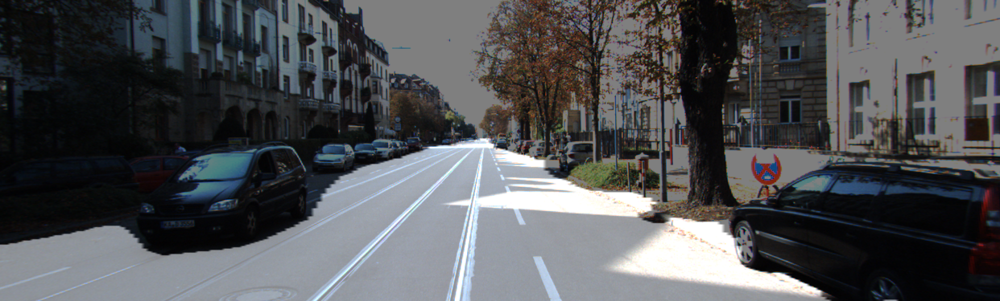

0번 image
IoU : 0.916751


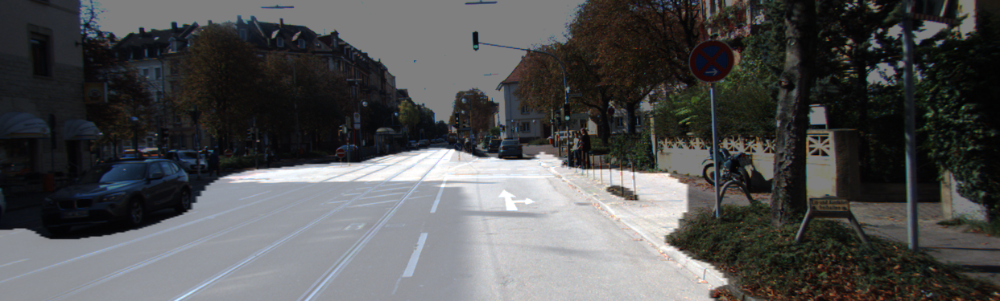

1번 image
IoU : 0.876480


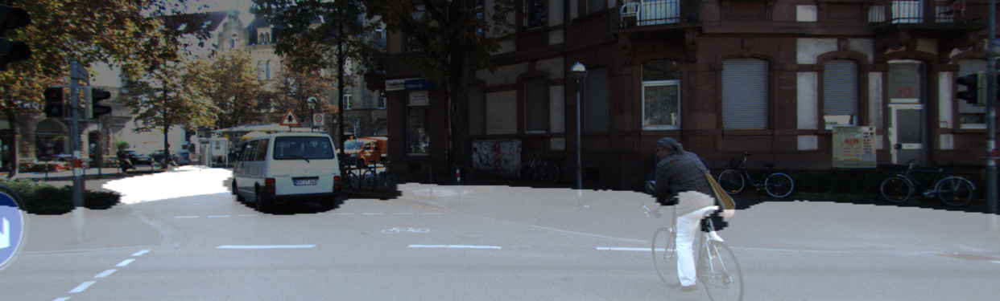

2번 image
IoU : 0.634288


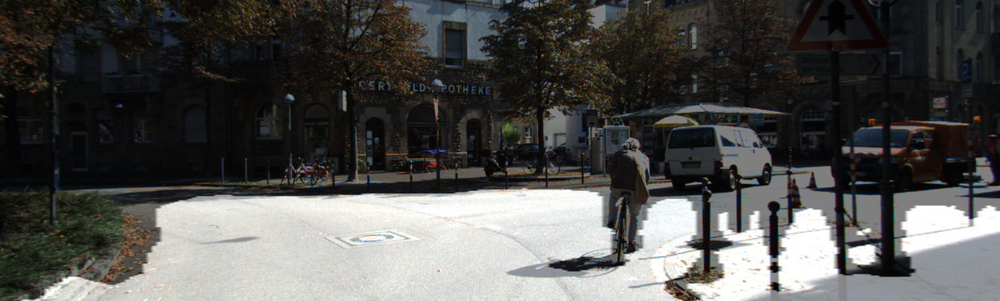

3번 image
IoU : 0.610873


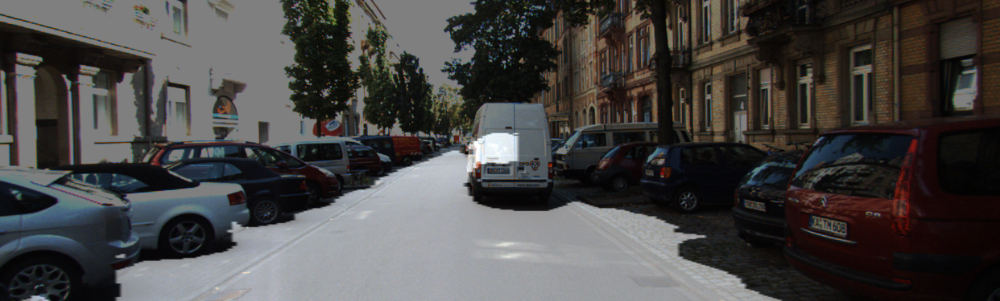

4번 image
IoU : 0.690403


In [55]:
# 다양한 이미지로 테스트 시도
for i in range(5):
    output, prediction, target = get_output(
        UNetPP, 
        test_preproc,
        image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
        output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
        label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
    )
    print(f'{i}번 image')
    calculate_iou_score(target, prediction)

In [56]:
UNetPP_best = build_UNetPP()
UNetPP_best.load_weights('./checkpoint/unetpp_epoch_50.hdf5')

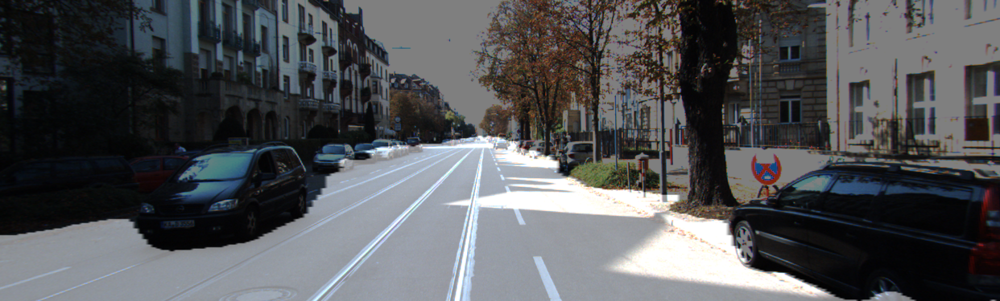

0번 image
IoU : 0.908015


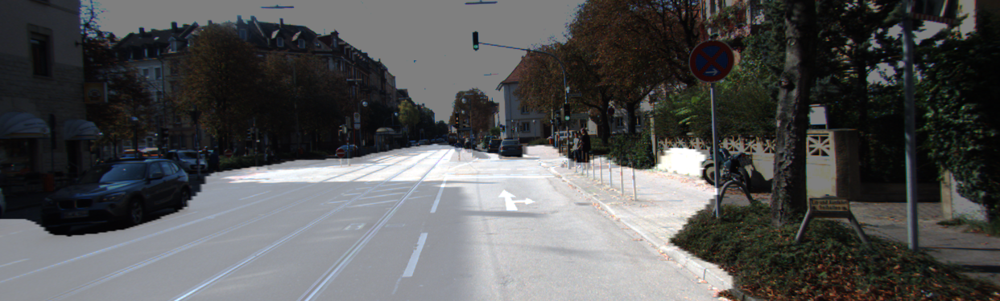

1번 image
IoU : 0.841440


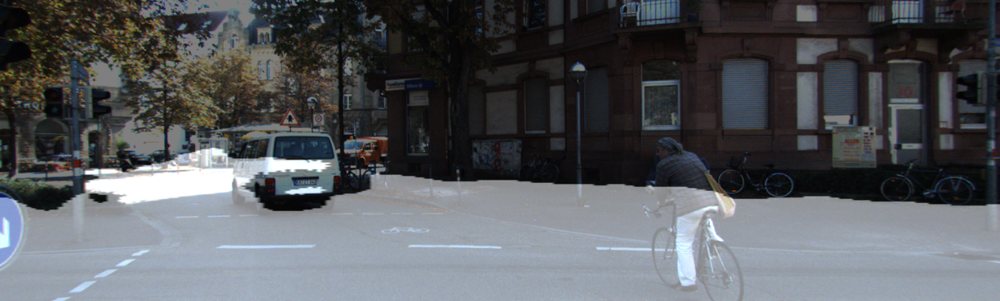

2번 image
IoU : 0.597387


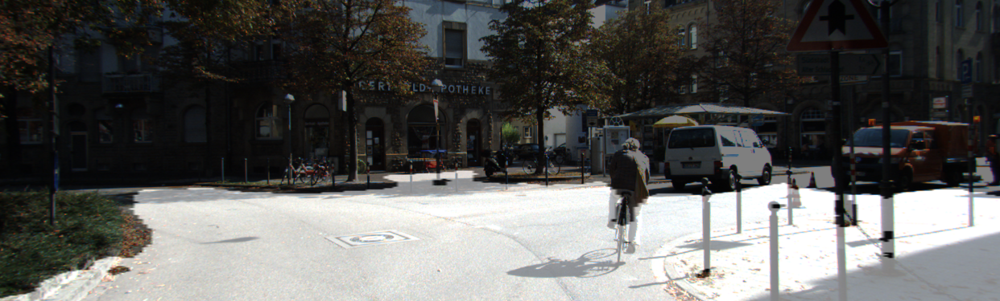

3번 image
IoU : 0.588616


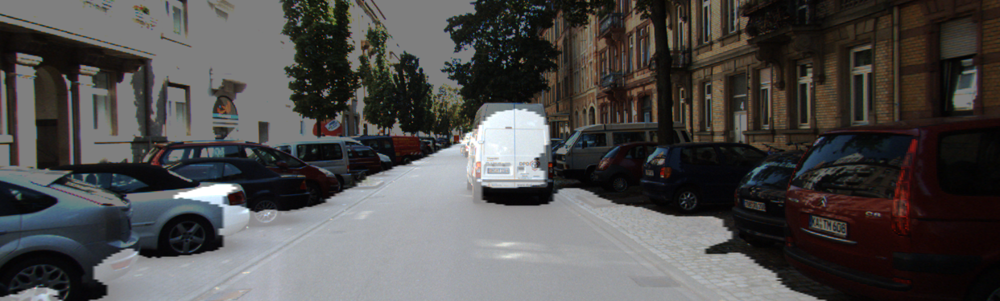

4번 image
IoU : 0.557426


In [57]:
# 다양한 이미지로 테스트 시도
for i in range(5):
    output, prediction, target = get_output(
        UNetPP_best, 
        test_preproc,
        image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
        output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
        label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
    )
    print(f'{i}번 image')
    calculate_iou_score(target, prediction)